In [1]:
import psrchive
import matplotlib.pyplot as plt
import numpy as np

In [2]:
def map_to_zero_one(arr):
    min_val = np.min(arr)
    max_val = np.max(arr)
    scaled_arr = (arr - min_val) / (max_val - min_val)
    return scaled_arr

In [47]:
import numpy as np

def calculate_snr(signal, noise):
    signal_power = np.mean(np.square(signal))
    noise_power = np.mean(np.square(noise))
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

In [3]:
def read_file(file_path):
    a = psrchive.Archive_load(file_path)
    #a.tscrunch()
    a.fscrunch()
    a.pscrunch()
    a.dedisperse()
    a.remove_baseline()
    data = a.get_data()
    
    print(np.shape(data))
    
    # Get weights
    #ww = np.array(a.get_weights(), dtype=bool)
    # Create array with only True with same shape as data
    #wts = np.ones(data.shape, dtype=bool)
    
    # If True in ww, set to false in wts
    # Essentially, creates the opposite of ww
    #wts[...,ww,:] = False
    
    # set all values in data with True in wts to nan
    #mata = data.copy()
    #mata[wts] = np.nan
    
    #Select only the arrays we are interested in
    #matadata = mata[0,0,:]

    #Perform the normalisation from 0 to 1 on the y axis
    data_normalized = (data - np.min(data))/(np.max(data) - np.min(data))
    
    return(data_normalized)

In [45]:
def plotting(data):
    fig = plt.figure(figsize=(15, 20))  # Set figure size directly in the figure call
    ax = fig.add_subplot(111)  # Add subplot

    #Set colormap
    # Create a colormap with purple color
    cmap = plt.cm.plasma  # You can use any other colormap as well
    cmap.set_bad(color='purple')

    # Create the plot using pcolormesh
    pcm = ax.pcolormesh(data, cmap='binary', vmin=0.01, vmax=0.08) #shading='nearest'

    # Set aspect ratio
    ax.set_aspect('auto')

    plt.title('Observation of Pulsar B0355+54 Using the UBB Receiver', fontsize=16)
    plt.ylabel("Time", fontsize=16)
    plt.xlabel("Pulse Phase (Bins)", fontsize=16)
    plt.axvline(x=480, color='r', linestyle='--')
    plt.show()
    plt.close()

In [5]:
def plotting_modes(data):
    fig = plt.figure(figsize=(15, 20))  # Set figure size directly in the figure call
    ax = fig.add_subplot(111)  # Add subplot
    
    x_arr = range(len(data))
    
    #Set colormap
    # Create a colormap with purple color
    cmap = plt.cm.plasma  # You can use any other colormap as well
    cmap.set_bad(color='purple')

    # Create the plot using pcolormesh
    pcm = ax.pcolormesh(data, cmap='binary', vmin=0.01, vmax=0.9) #shading='nearest'

    # Set aspect ratio
    ax.set_aspect('auto')

    plt.title('Observation of Pulsar B0355+54 Using the UBB Receiver', fontsize=16)
    plt.ylabel("Pulse Number", fontsize=16)
    plt.xlabel("Pulse Phase (Bins)", fontsize=16)
    
    plt.show()
    plt.close()

In [6]:
def remove_outliers(data):
    # Flatten the array of arrays to compute the 99th percentile
    flat_data = np.concatenate(data[:,400:650])
    percentile_99 = np.percentile(flat_data, 99.99)
    print('threshhold is: ' + str(percentile_99))

    # Count outliers and replace arrays with values above the 99th percentile with NaN-filled arrays
    num_outliers_replaced = 0
    cleaned_data = []
    for arr in data:
        if np.any(arr > percentile_99):
            num_outliers_replaced += 1
            cleaned_data.append(np.full_like(arr, np.nan))  # Fill array with NaNs
        else:
            cleaned_data.append(arr)

    # Print the number of outliers replaced
    print(f"Number of outliers replaced with NaNs: {num_outliers_replaced}")

    return cleaned_data

In [7]:
data = read_file('/srv/storage_11/galc/UBB/jtremblay/20240301/moding/B0355+54_calibrated_search1.0001.FF')

(3840, 1, 1, 1024)


In [8]:
print(np.shape(data))

(3840, 1, 1, 1024)


In [9]:
data_full = data[:,0,0,:]

In [10]:
print(np.shape(data_full))

(3840, 1024)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


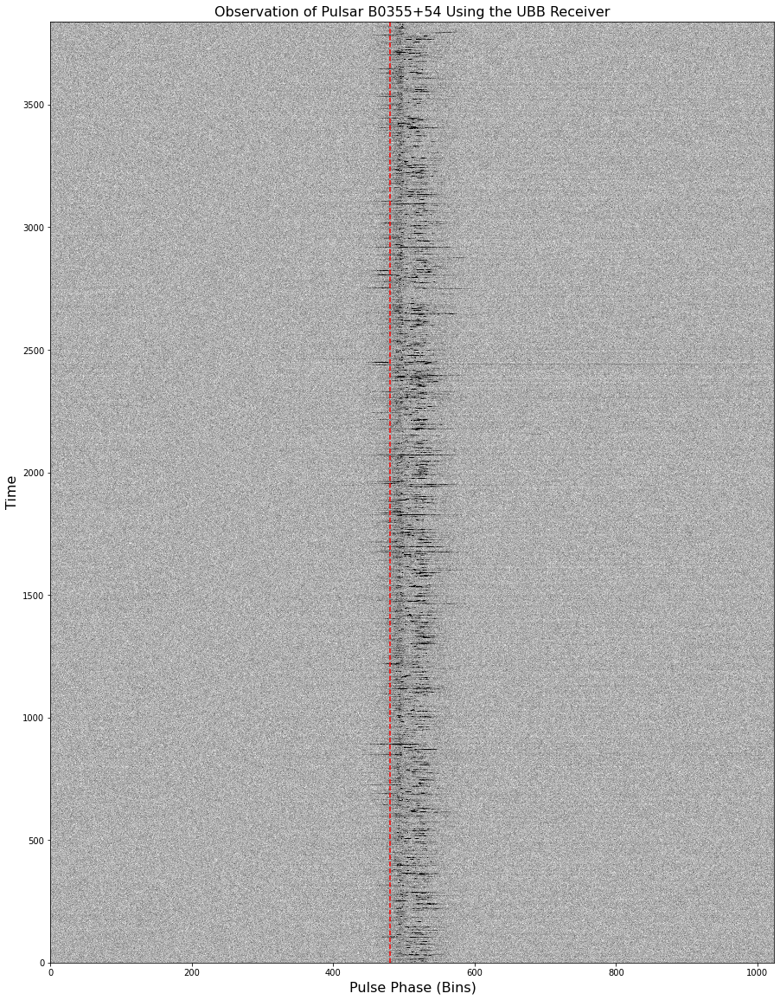

In [46]:
plotting(data_full)

Now we try to look at pulses to the extreme left (This is being tested may there is a better way to extract leftmost components)

In [61]:
normal_mode5 = []
abnormal_mode5 = []

data_extreme_left = data_full[:,430:480]

noise_array = np.concatenate((data_full[:,:400], data_full[:,-650:]), axis=1)
snr = calculate_snr(data_extreme_left, noise_array)

for i in range(len(data)):
    snr = calculate_snr(data_extreme_left[i], noise_array[i])
    if snr >= 1:
        abnormal_mode5.append(data_full[i].copy())
    else:
        normal_mode5.append(data_full[i].copy())

(1, 1024)
(1, 1024)


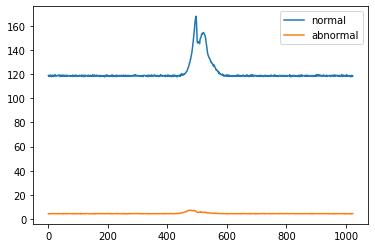

In [62]:
abnormal_mode_sum5 = np.sum(abnormal_mode5, axis=0, keepdims=True)
normal_mode_sum5 = np.sum(normal_mode5, axis=0, keepdims=True)

# Check the shape of the resulting array
print(abnormal_mode_sum5.shape)
print(normal_mode_sum5.shape)

plt.plot(normal_mode_sum5.T, label = 'normal')
plt.plot(abnormal_mode_sum5.T, label = 'abnormal')
plt.legend()
plt.show()
plt.close()

Here we try to see if removing the brightest pulses will allow us to see the behaviour better?

In [12]:
data_no_outliers = remove_outliers(data_full)

threshhold is: 0.2568625532239504
Number of outliers replaced with NaNs: 47


In [13]:
print(np.shape(data_full))
print(np.shape(data_no_outliers))

(3840, 1024)
(3840, 1024)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


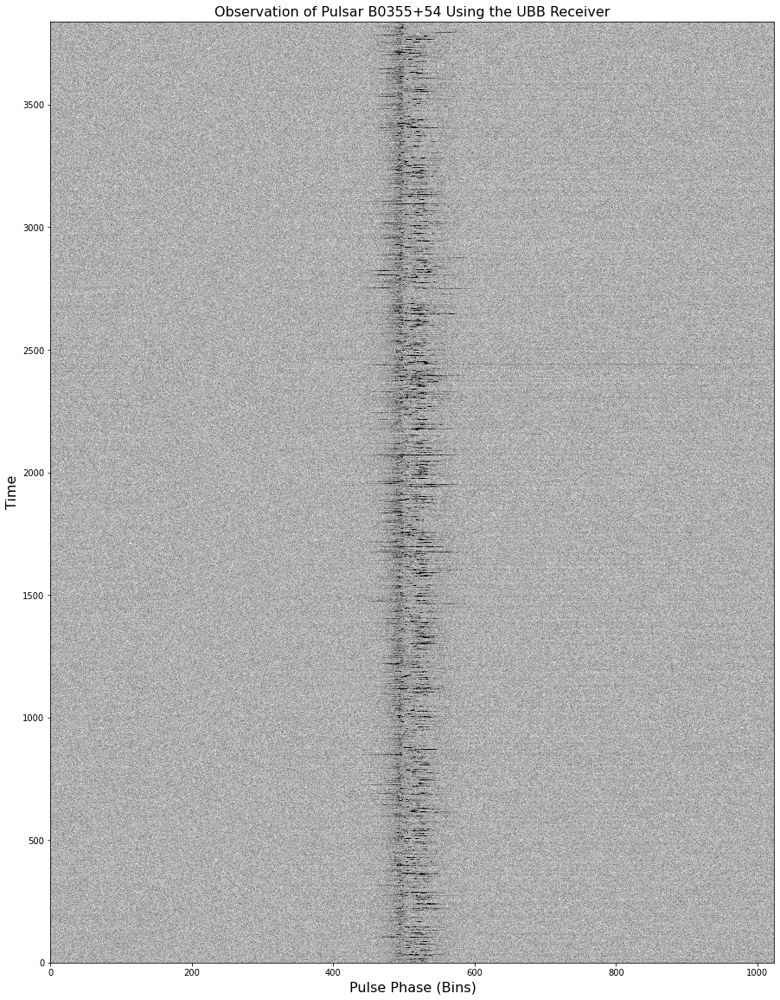

In [14]:
plotting(data_no_outliers)

In [15]:
time_range = np.arange(0,1024)
#Convert x-axis to degrees
time_range_turns = map_to_zero_one(time_range)

In [16]:
data = data_full[:,400:600]

In [17]:
print(np.shape(data))

(3840, 200)


In [18]:
print(len(data))

3840


In [19]:
data_left_pulse = data[:,75:102] #data[:,75:110]
data_right_pulse = data[:,102:145] #data[:,110:145]

In [20]:
normal_mode = []
abnormal_mode = []

for i in range(len(data)):
    if np.max(data_left_pulse[i]) > np.max(data_right_pulse[i]):
        abnormal_mode.append(data[i].copy())  # Append a copy of data[i] to avoid modifying the original data
    elif np.max(data_left_pulse[i]) < np.max(data_right_pulse[i]):
        normal_mode.append(data[i].copy())  # Append a copy of data[i] to avoid modifying the original data
    else:
        print('What happened?')

In [21]:
print(np.shape(abnormal_mode))

(1824, 200)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  # Remove the CWD from sys.path while we load stuff.


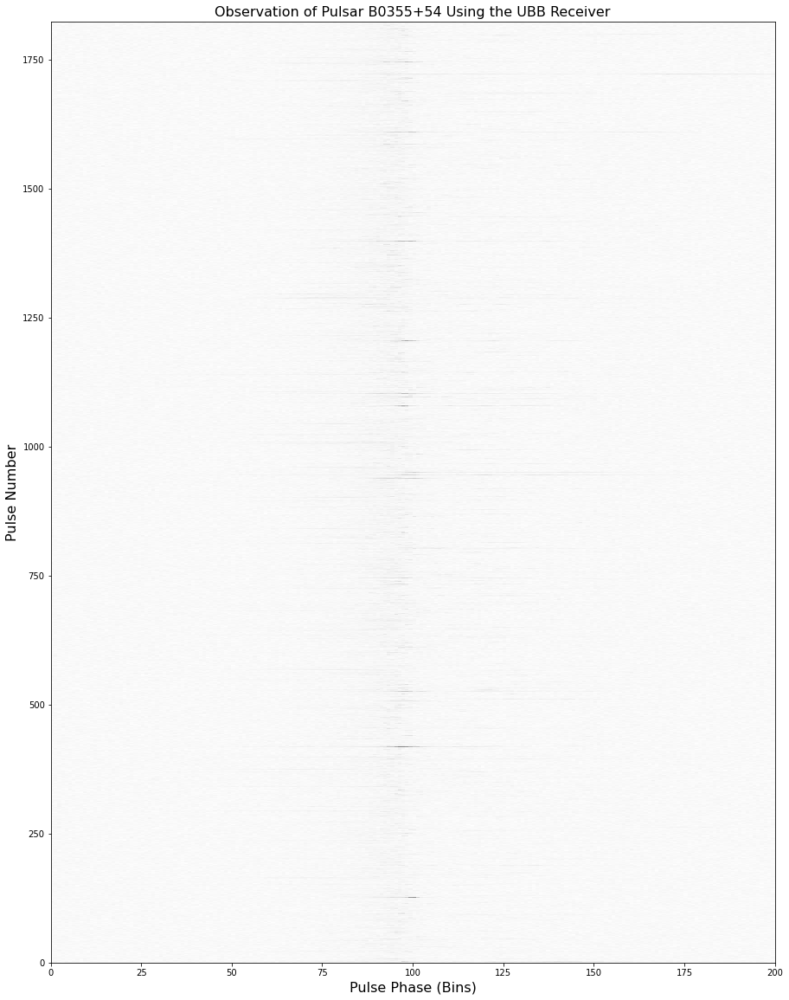

In [22]:
plotting_modes(abnormal_mode)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  # Remove the CWD from sys.path while we load stuff.


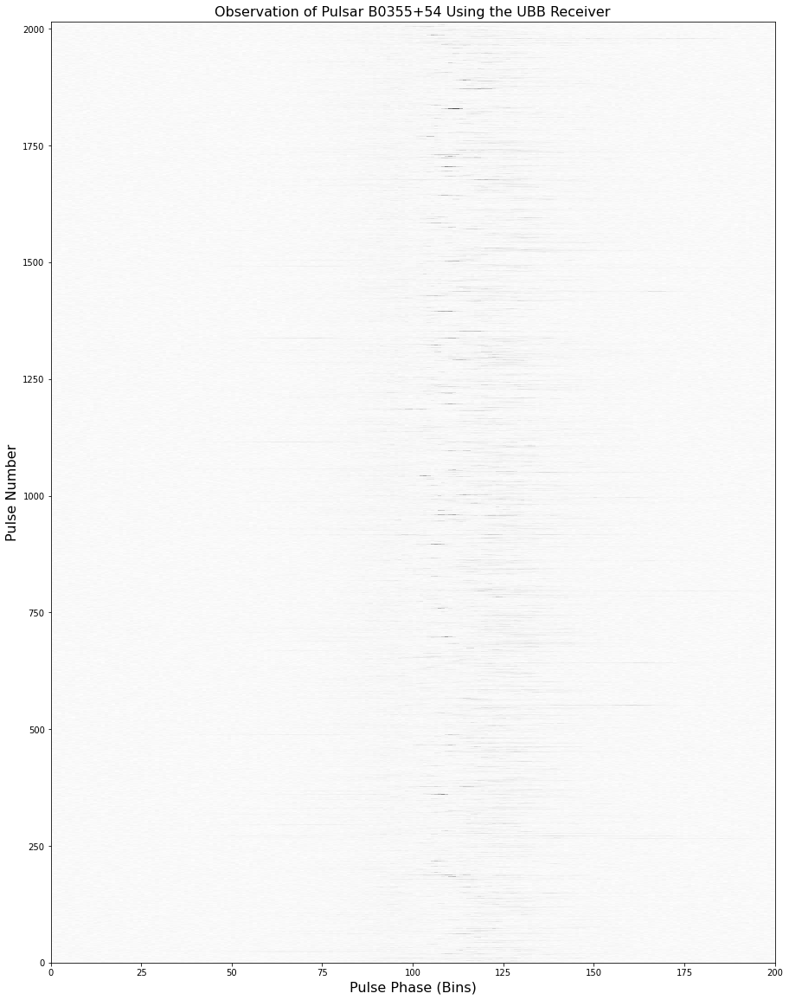

In [23]:
plotting_modes(normal_mode)

(1, 200)
(1, 200)


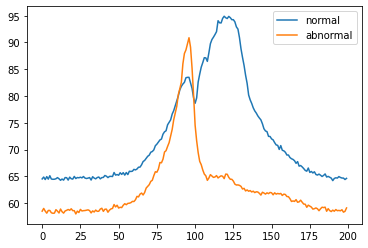

In [24]:
abnormal_mode_sum = np.sum(abnormal_mode, axis=0, keepdims=True)
normal_mode_sum = np.sum(normal_mode, axis=0, keepdims=True)

# Check the shape of the resulting array
print(normal_mode_sum.shape)
print(abnormal_mode_sum.shape)

plt.plot(normal_mode_sum.T, label = 'normal')
plt.plot(abnormal_mode_sum.T, label = 'abnormal')
plt.legend()
plt.show()
plt.close()

Method 2 finds if the maximum of the noise is smaller than the max in the area of the second peak, then we consider the second peak as existing

In [25]:
normal_mode2 = []
abnormal_mode2 = []

rms_noise = np.sqrt(np.mean(data_full[i,0:200]**2))

for i in range(len(data)):
    if np.max(data_full[i,0:350]) < np.max(data_right_pulse[i]):
        normal_mode2.append(data_full[i].copy())  # Append a copy of data[i] to avoid modifying the original data
    else:
        abnormal_mode2.append(data_full[i].copy())  # Append a copy of data[i] to avoid modifying the original data

(1, 1024)
(1, 1024)


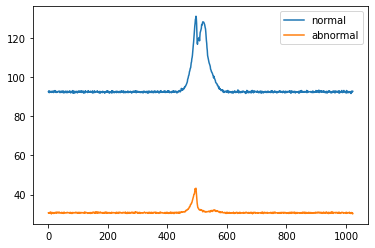

In [26]:
abnormal_mode_sum2 = np.sum(abnormal_mode2, axis=0, keepdims=True)
normal_mode_sum2 = np.sum(normal_mode2, axis=0, keepdims=True)

# Check the shape of the resulting array
print(abnormal_mode_sum2.shape)
print(normal_mode_sum2.shape)

plt.plot(normal_mode_sum2.T, label = 'normal')
plt.plot(abnormal_mode_sum2.T, label = 'abnormal')
plt.legend()
plt.show()
plt.close()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


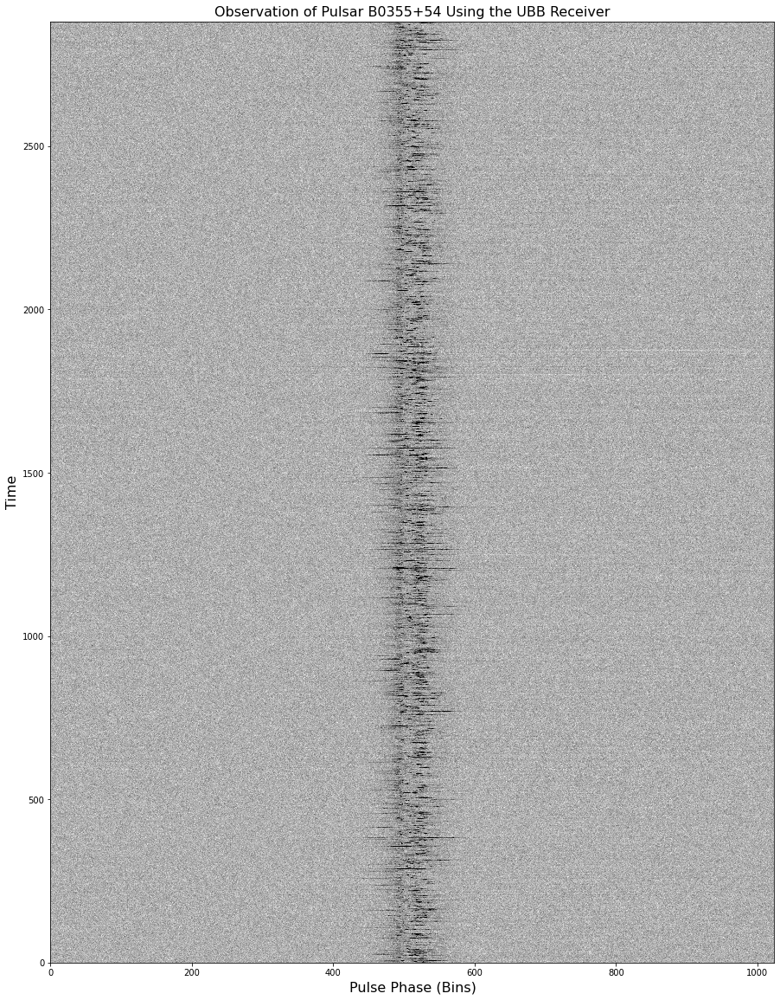

In [27]:
plotting(normal_mode2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


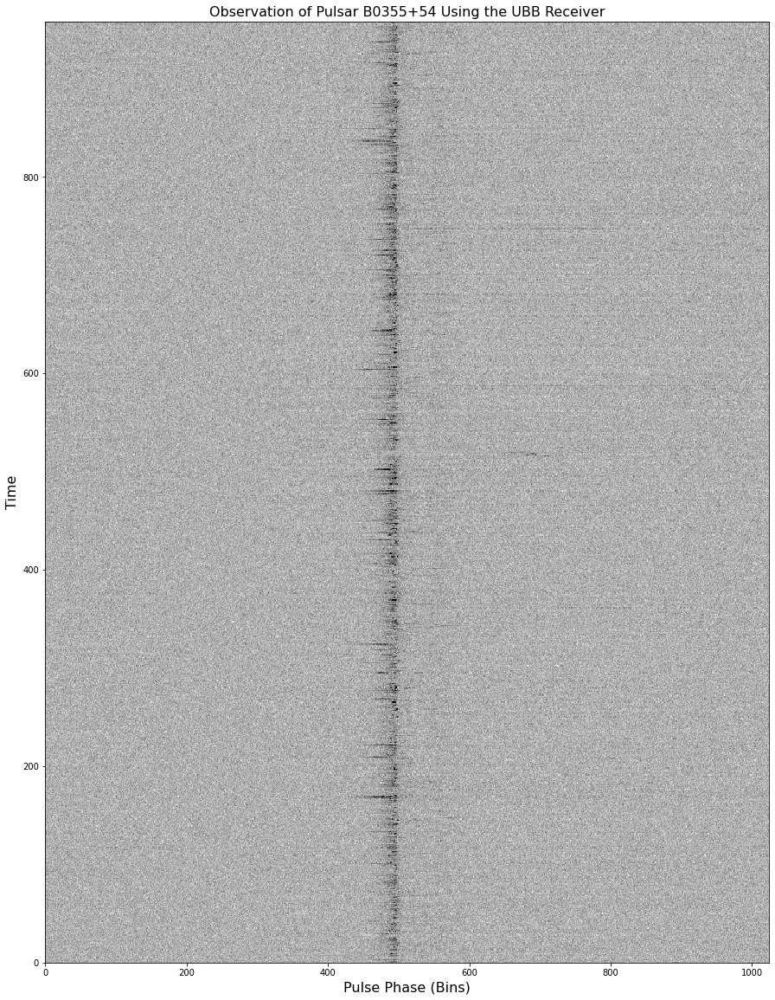

In [28]:
plotting(abnormal_mode2)

Let's try a S/N approach

In [30]:
normal_mode3 = []
abnormal_mode3 = []

noise_array = np.concatenate((data_full[:,:400], data_full[:,-650:]), axis=1)
snr = calculate_snr(data_right_pulse, noise_array)

for i in range(len(data)):
    snr = calculate_snr(data_right_pulse[i], noise_array[i])
    if snr >= 2:
        abnormal_mode3.append(data_full[i].copy())
    else:
        normal_mode3.append(data_full[i].copy())

(1, 1024)
(1, 1024)


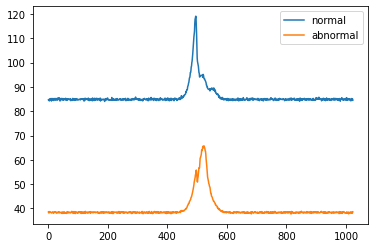

In [31]:
abnormal_mode_sum3 = np.sum(abnormal_mode3, axis=0, keepdims=True)
normal_mode_sum3 = np.sum(normal_mode3, axis=0, keepdims=True)

# Check the shape of the resulting array
print(abnormal_mode_sum3.shape)
print(normal_mode_sum3.shape)

plt.plot(normal_mode_sum3.T, label = 'normal')
plt.plot(abnormal_mode_sum3.T, label = 'abnormal')
plt.legend()
plt.show()
plt.close()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


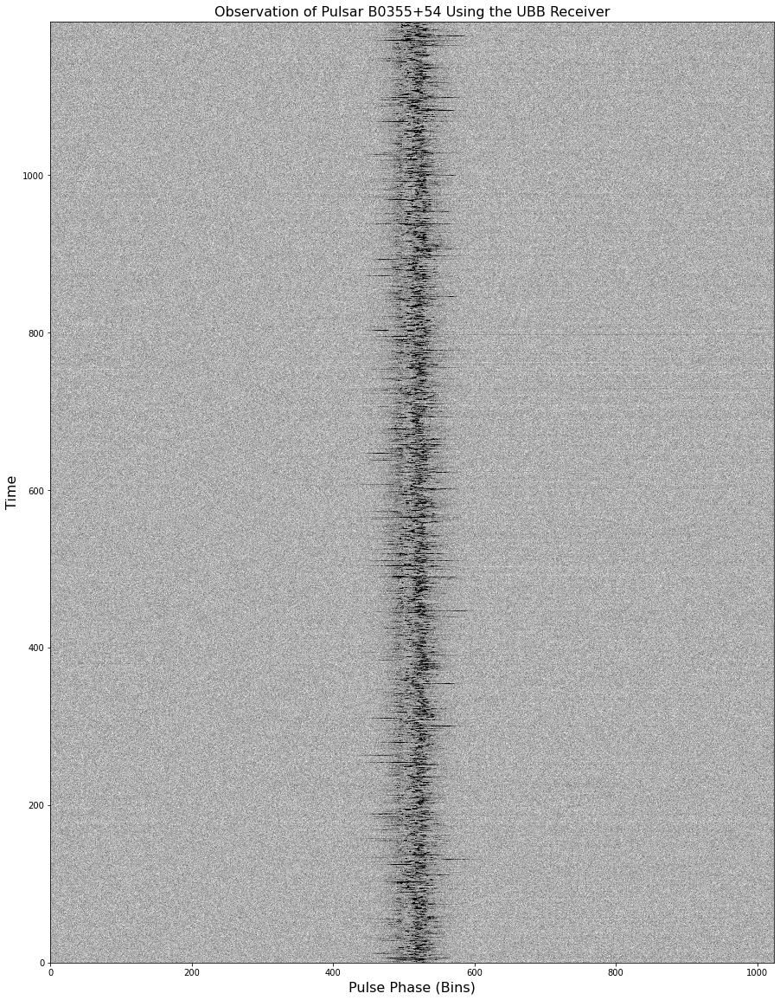

In [32]:
plotting(abnormal_mode3)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


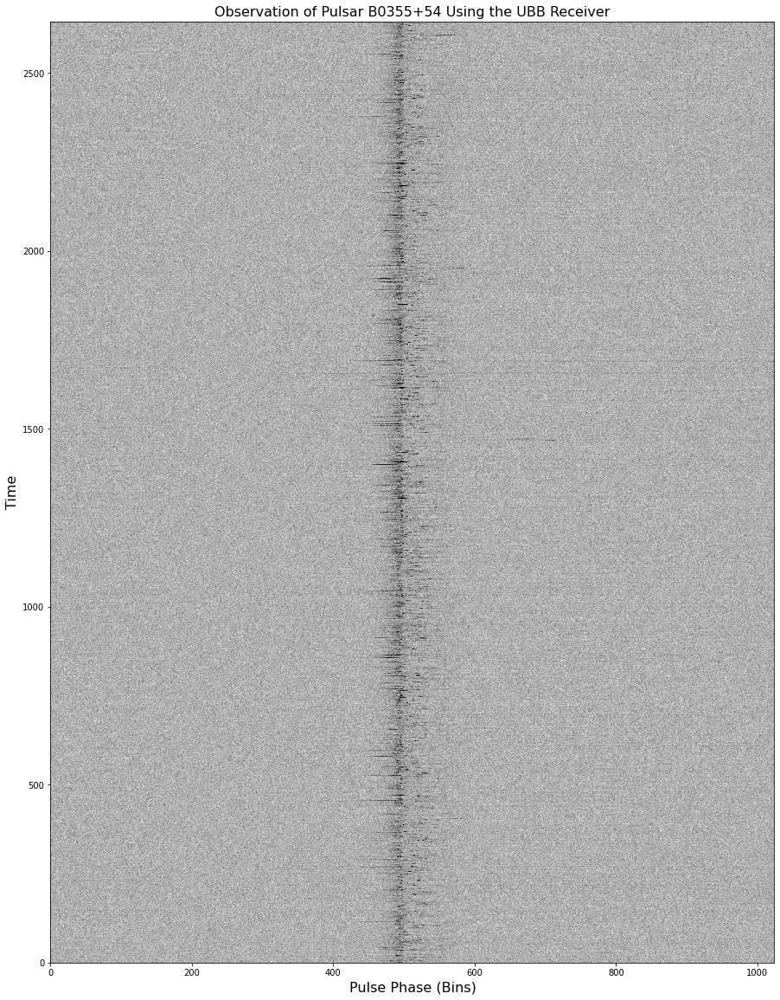

In [33]:
plotting(normal_mode3)

Maybe we can find some modes by correlating the pulse profile to each individual pulse?

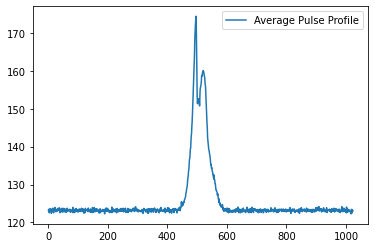

In [34]:
average_profile = np.sum(data_full, axis=0, keepdims=True)
plt.plot(average_profile.T, label = 'Average Pulse Profile')
plt.legend()
plt.show()
plt.close()

Length of average_profile: 1
Length of data_full: 3840


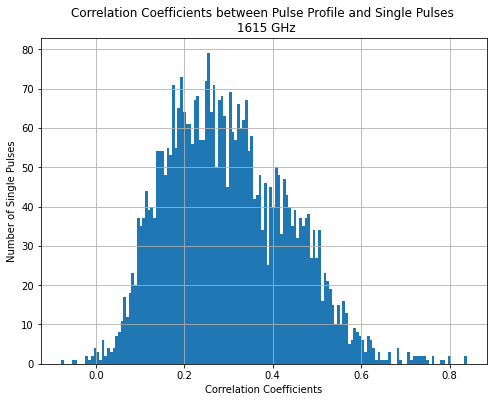

In [35]:
# Calculate correlations
# Check the lengths of average_profile and data_full
print("Length of average_profile:", len(average_profile))
print("Length of data_full:", len(data_full))


correlation_results = []
grouped_lists = {'group1': [], 'group2': [], 'group3': [], 'group4': []}


for pulse in data_full:
    correlation = np.corrcoef(average_profile, pulse)[0,1] # Compute correlation coefficient
    correlation_results.append(correlation)
    # Categorize based on correlation coefficient
    if correlation < 0.00:
        grouped_lists['group1'].append(pulse)
    elif 0.00 <= correlation < 0.15:
        grouped_lists['group2'].append(pulse)
    elif 0.15 <= correlation < 0.38:
        grouped_lists['group3'].append(pulse)
    else:
        grouped_lists['group4'].append(pulse)

# Create plot
plt.figure(figsize=(8, 6))
plt.hist(correlation_results, bins=150)
plt.xlabel('Correlation Coefficients')
plt.ylabel('Number of Single Pulses')
#plt.axvline(x=0.34, color='red')
plt.title('Correlation Coefficients between Pulse Profile and Single Pulses \n 1615 GHz')
#plt.gca().invert_yaxis()  # Invert y-axis to match the order of single pulses
plt.grid(True)
plt.show()

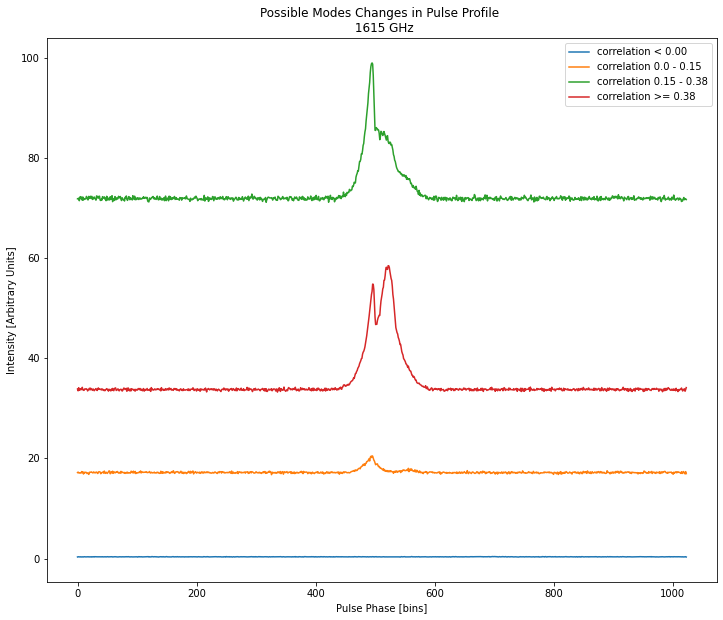

In [36]:
sum1 = np.sum(grouped_lists['group1'], axis=0, keepdims=True)
sum2 = np.sum(grouped_lists['group2'], axis=0, keepdims=True)
sum3 = np.sum(grouped_lists['group3'], axis=0, keepdims=True)
sum4 = np.sum(grouped_lists['group4'], axis=0, keepdims=True)
plt.figure(figsize=(12, 10))
plt.plot(sum1.T, label = 'correlation < 0.00')
plt.plot(sum2.T, label = 'correlation 0.0 - 0.15')
plt.plot(sum3.T, label = 'correlation 0.15 - 0.38')
plt.plot(sum4.T, label = 'correlation >= 0.38')
#plt.plot(no_nulling_sum.T, label = 'no_nulling')
plt.xlabel('Pulse Phase [bins]')
plt.ylabel('Intensity [Arbitrary Units]')
plt.title('Possible Modes Changes in Pulse Profile \n 1615 GHz')
plt.legend()
plt.show()
plt.close()

Now let's look at nulling:

In [37]:
nulling = []
no_nulling = []

noise_array = np.concatenate((data_full[:,:400], data_full[:,-650:]), axis=1)
snr = calculate_snr(data_right_pulse, noise_array)

for i in range(len(data)):
    snr = calculate_snr(data_full[i,400:650], noise_array[i])
    if snr >= 0.01:
        no_nulling.append(data_full[i].copy())
    else:
        nulling.append(data_full[i].copy())
print(np.shape(nulling))
print(np.shape(no_nulling))

(42, 1024)
(3798, 1024)


(1, 1024)
(1, 1024)


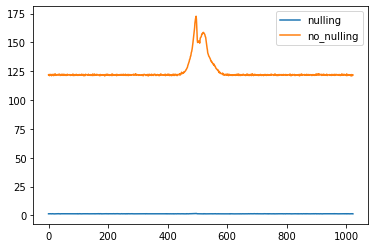

In [38]:
nulling_sum = np.sum(nulling, axis=0, keepdims=True)
no_nulling_sum = np.sum(no_nulling, axis=0, keepdims=True)

# Check the shape of the resulting array
print(nulling_sum.shape)
print(no_nulling_sum.shape)

plt.plot(nulling_sum.T, label = 'nulling')
plt.plot(no_nulling_sum.T, label = 'no_nulling')
plt.legend()
plt.show()
plt.close()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("plasma"))
  


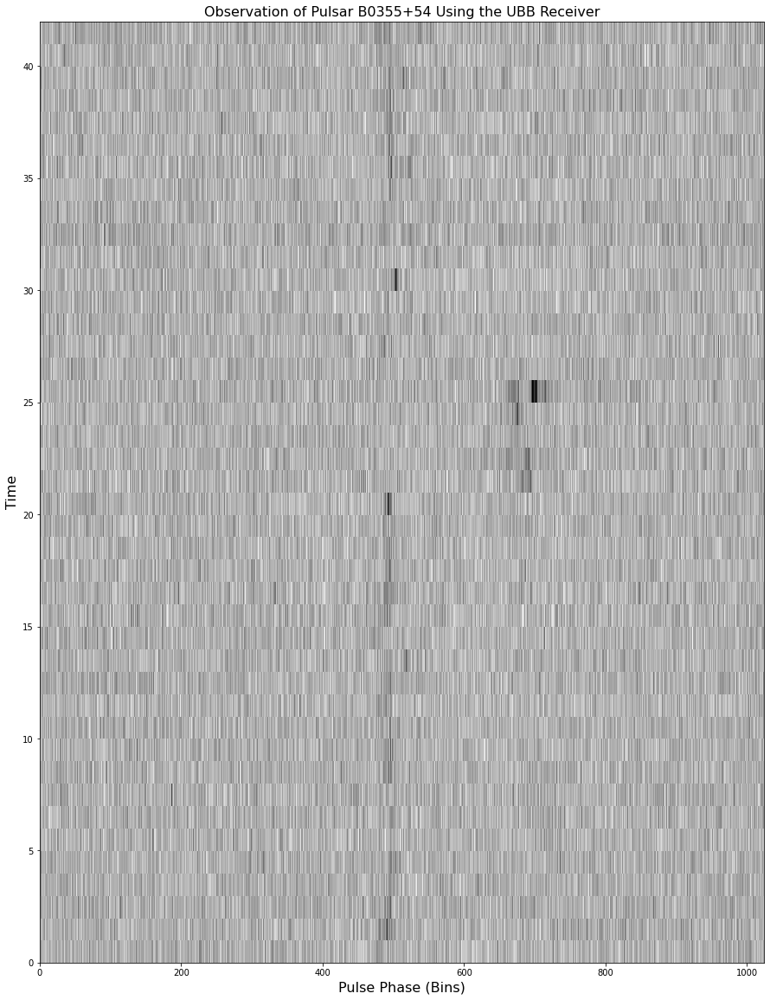

In [39]:
plotting(nulling)